In [1]:
import cv2 
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from PIL import Image, ImageFilter
import scipy
%matplotlib inline

In [4]:
#import pyheif
import os

os.chdir('/Users/xxx/Documents/Data')


<h1>FLIR Data</h1>

Ok, great! We have confirmed that the FLIR data has an NON-ANNOTATED set of thermal 16-bit and 8-bit images with RGB for train, val, and video.

- Training:
-- RGB, only 8,363 images <- will only be able to train with their associated pairs
-- thermal 8-bit 8862
-- thermal 16-bit 8862

- Validation:
-- RGB 1,257 images <- same thing, missing thermal pairs, so can only train with these associated pairs
-- thermal 8-bit 1366
-- thermal 16-bit 1366

- Video: Extra video frames to use as a test set:
-- RGB 4195 images
-- thermal 8-bit 4224
-- thermal 16-bit 4224


<h2>Video Dir</h2>

In [5]:
from skimage import io

(-0.5, 639.5, 511.5, -0.5)

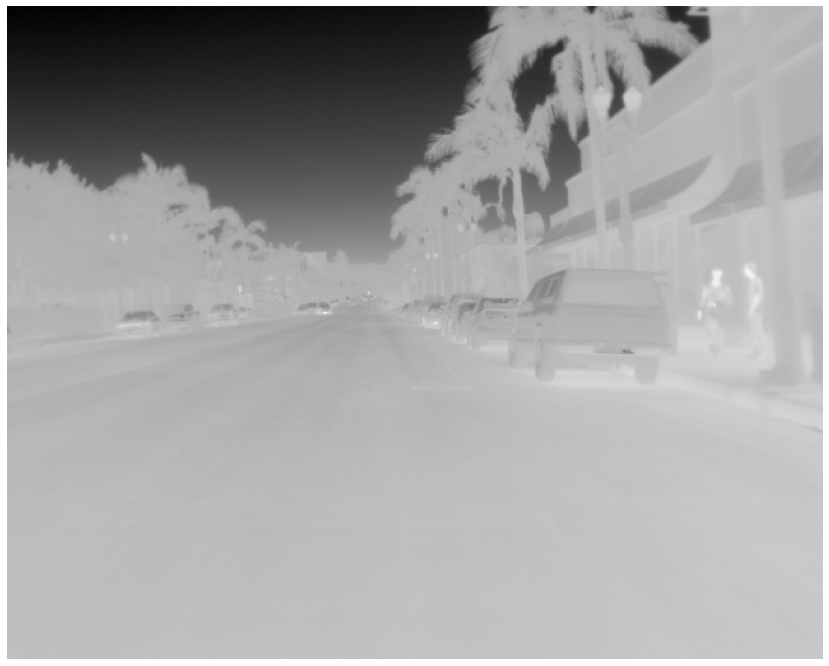

In [5]:
#thermal 16-bit
plt.figure(figsize = (20,12))

img = io.imread('flir_data/FLIR_video_00001.tiff')
plt.imshow(img, cmap="gray")
plt.axis("off")

512 640


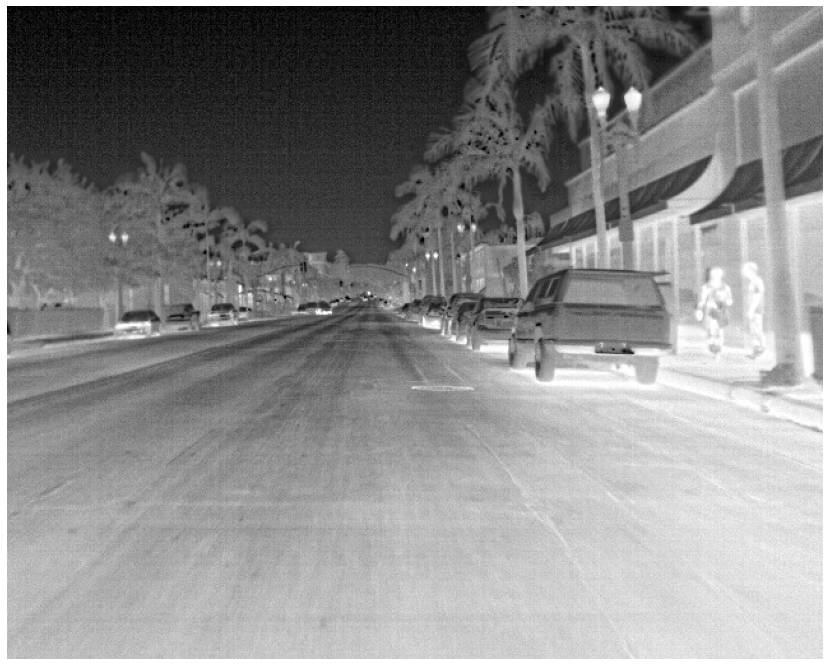

In [15]:
#thermal 8-bit
plt.figure(figsize = (20,12))

image = cv2.imread("flir_data/FLIR_video_00001.jpeg")
height, width = image.shape[:2]
print(height, width)
plt.axis("off")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

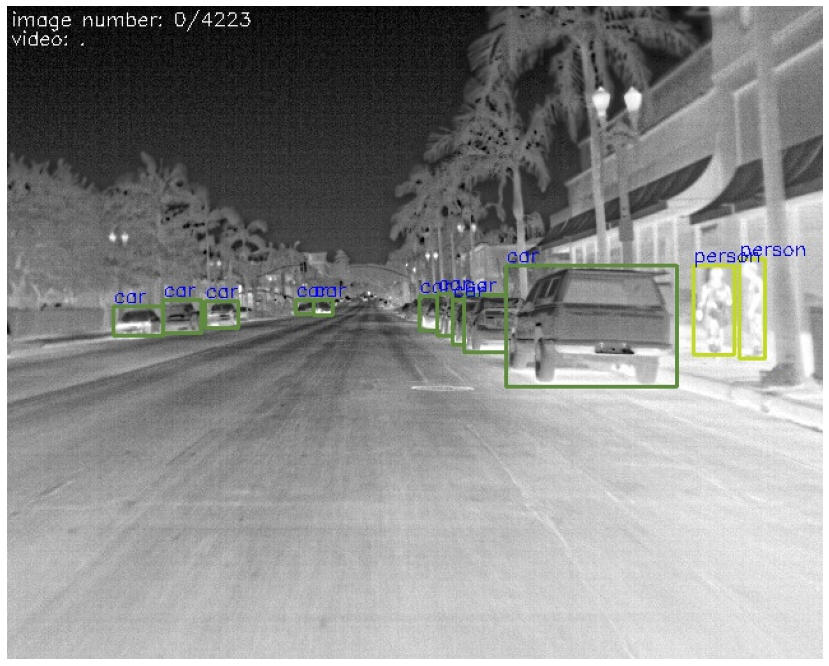

In [7]:
#thermal 8-bit WITH annotations
plt.figure(figsize = (20,12))

image = cv2.imread("flir_data/FLIR_video_00001_ann.jpeg")
plt.axis("off")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()


1600 1800


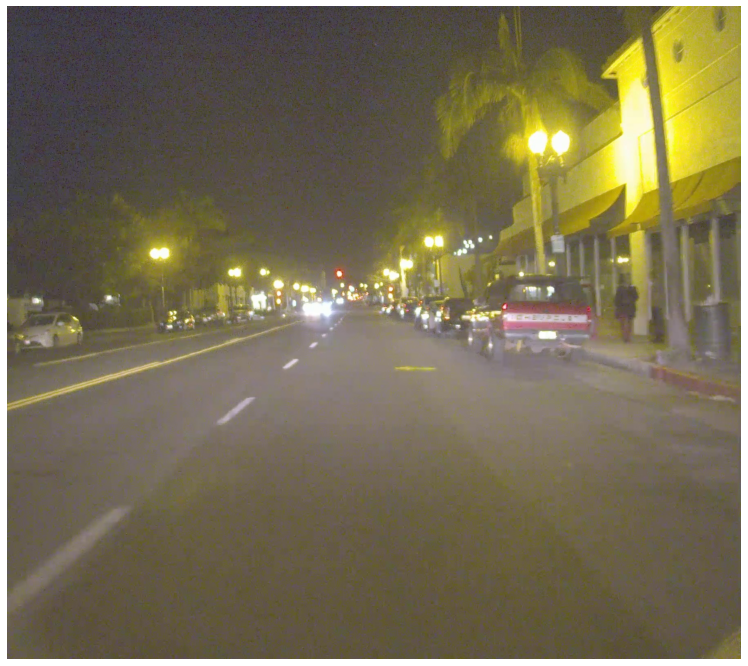

In [16]:
plt.figure(figsize = (20,12))

image = cv2.imread("flir_data/FLIR_video_00001.jpg")
height, width = image.shape[:2]
print(height, width)

plt.axis("off")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

<h2>Example from `train` directory</h2>

(-0.5, 639.5, 511.5, -0.5)

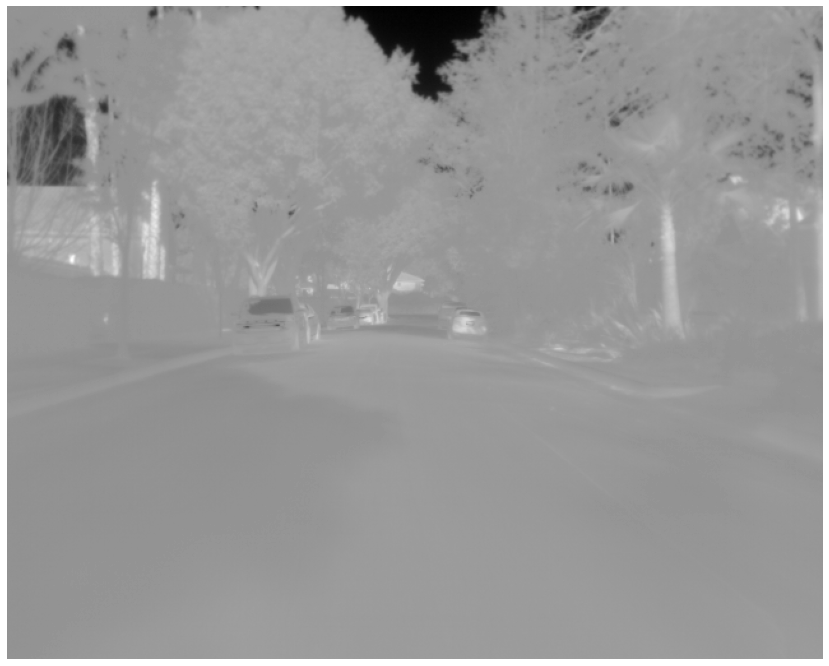

In [10]:
#thermal 16-bit
plt.figure(figsize = (20,12))

img = io.imread('flir_data/FLIR_00013.tiff')
plt.imshow(img, cmap="gray")
plt.axis("off")

512 640


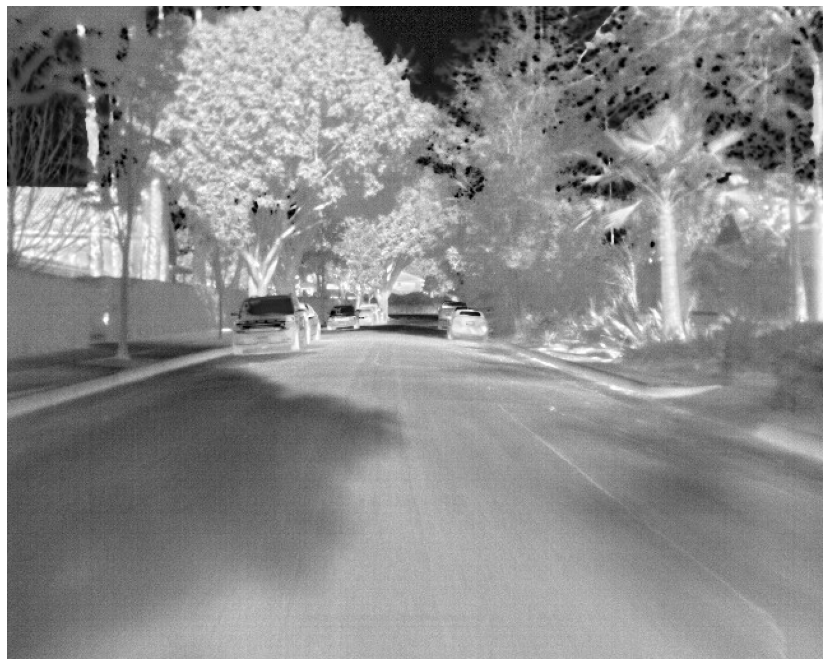

In [17]:
#thermal 8-bit
plt.figure(figsize = (20,12))

image = cv2.imread("flir_data/FLIR_00013.jpeg")
height, width = image.shape[:2]
print(height, width)


plt.axis("off")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

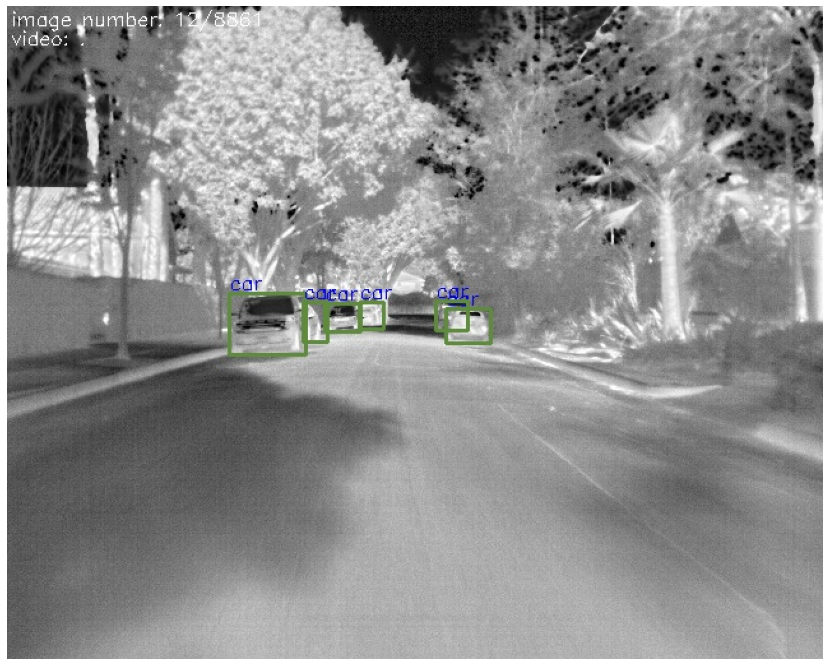

In [12]:
#has annotations
plt.figure(figsize = (20,12))

image = cv2.imread("flir_data/FLIR_00013_ann.jpeg")
plt.axis("off")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()


1600 1800


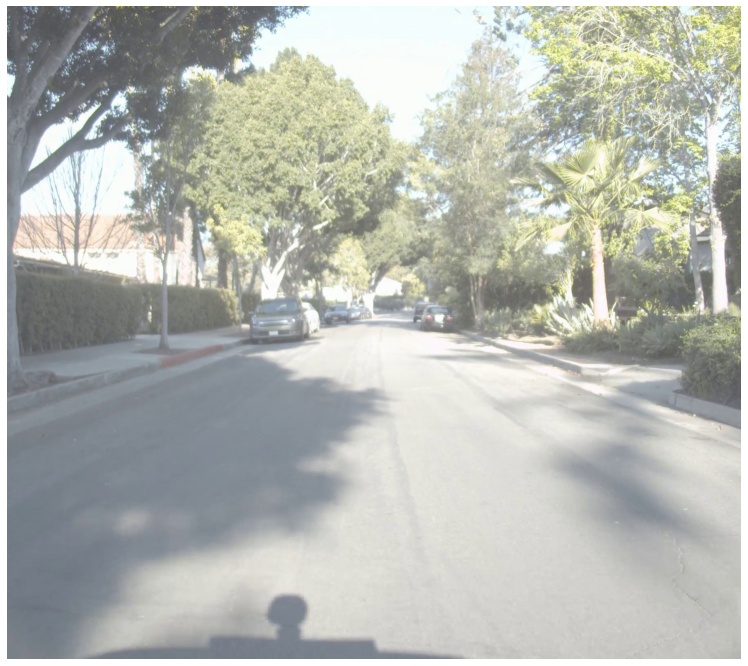

In [18]:
plt.figure(figsize = (20,12))

image = cv2.imread("flir_data/FLIR_00013.jpg")
height, width = image.shape[:2]
print(height, width)

plt.axis("off")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

<h2>Resize all images</h2>

In [6]:
from __future__ import print_function

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display # to display images
from PIL import Image
import os, sys
%matplotlib inline 

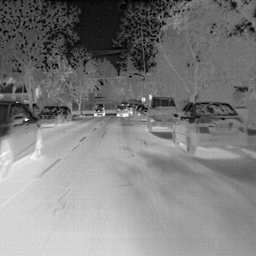

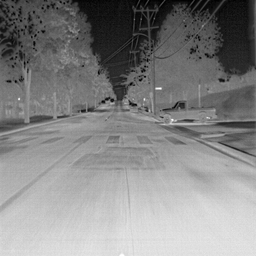

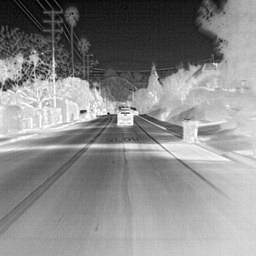

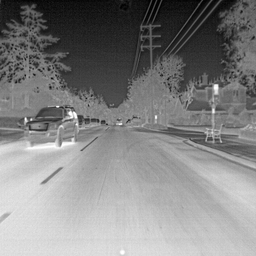

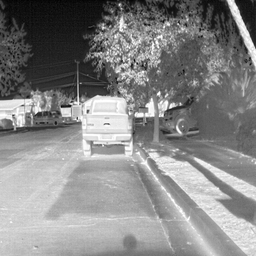

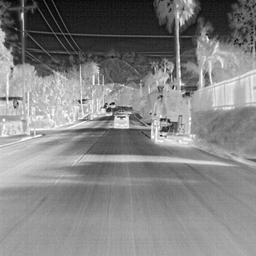

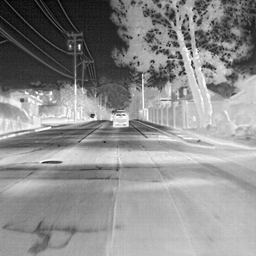

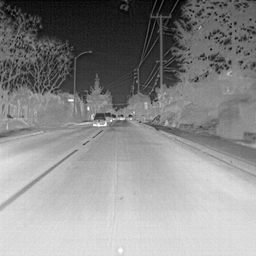

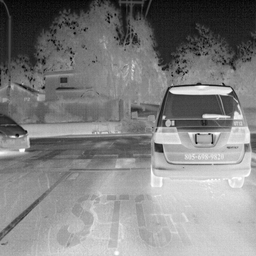

In [21]:
#Let's test this out first

test_path = "flir_data/test_the_function/thermal"
outpath256 =  "flir_data/new_bmps/thermal"
#dirs = os.listdir(path)
neww, newh = 256, 256

def resize_unet256(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            if counter <=10:
                display(resized) #see in notebook

resize_unet256(test_path, outpath256)

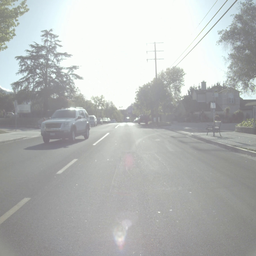

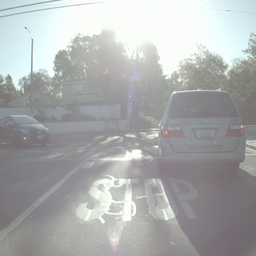

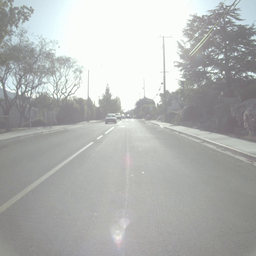

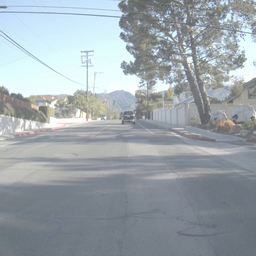

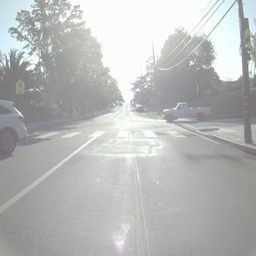

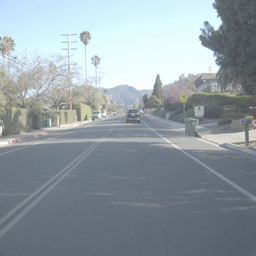

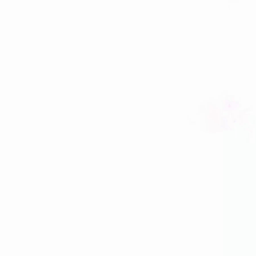

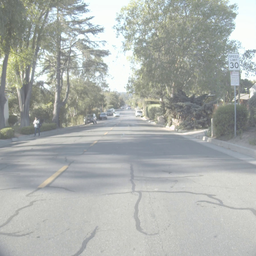

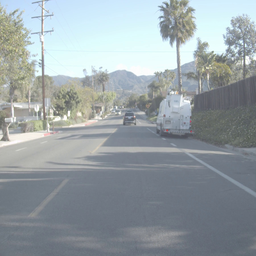

In [22]:
#do it for visible

test_path = "flir_data/test_the_function/visible"
outpath256 =  "flir_data/new_bmps/visible"
#dirs = os.listdir(path)
neww, newh = 256, 256

def resize_unet256(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            if counter <=10:
                display(resized) #see in notebook

resize_unet256(test_path, outpath256)

<h1>Showtime</h1>
Some will have NO MATCH.

`train` folder: 499 thermal images have no RGB match

- thermal_8_bit has 8,862 images:  /home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/train/thermal_8_bit
- rgb has 8,363 images: /home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/train/RGB

`val` folder: 109 thermal images have no RGB match 

- thermal_8_bit has 1,366 images: /home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/val/thermal_8_bit
- rgb has 1,257 images: /home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/val/RGB

FLIR_10227.jpg

`video` folder: 

- rgb: /home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/video/RGB
- thermal: /home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/video/thermal_8_bit

In [8]:
#dirs = os.listdir(path)
neww, newh = 256, 256

def resize_unet256(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            if counter <=10:
                display(resized) #see in notebook

In [23]:
8862-8363

499

In [24]:
1366-1257

109

<b>TRAIN -> RGB </b>

In [27]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

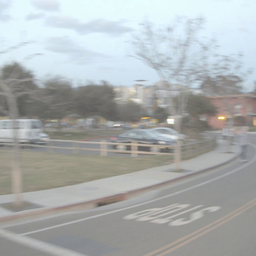

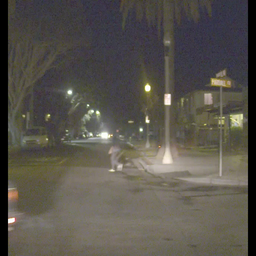

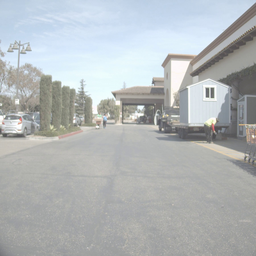

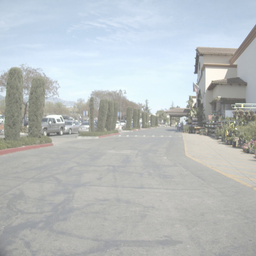

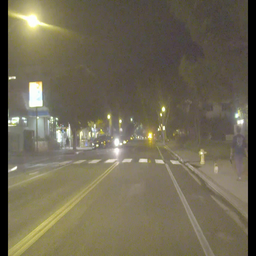

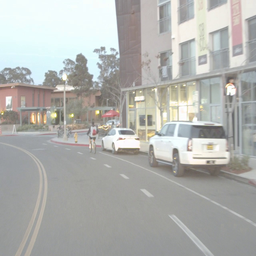

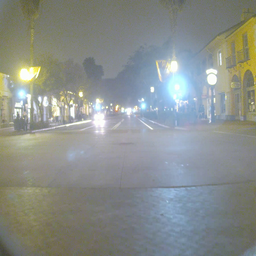

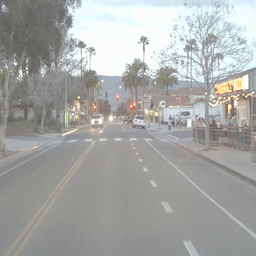

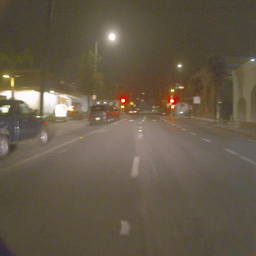

In [9]:
# Note, I changed these paths for my Mac (July 19, 2020)
test_path = "/Users/xxx/Documents/Data/FLIR_ADAS_1_3/train/RGB" #INPUT FLIR_ADAS Dir use the absolute path
outpath256 =  "/Users/xxx/Documents/vt_cgans/flir_data/train/rgb" #WHERE I WANT THE NEW 256X256 BMPs
#dirs = os.listdir(path)
neww, newh = 256, 256

resize_unet256(test_path, outpath256)

<b>Train -> Thermal</b>

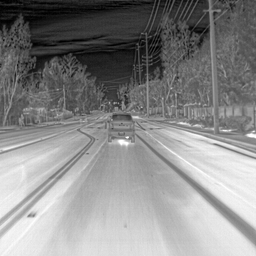

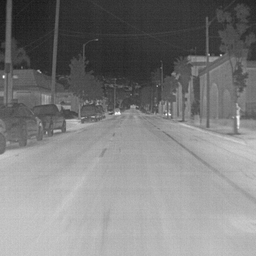

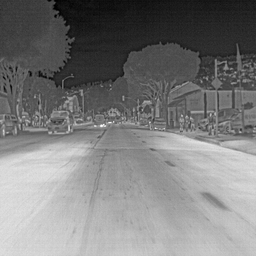

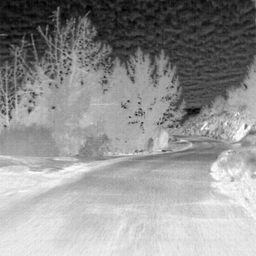

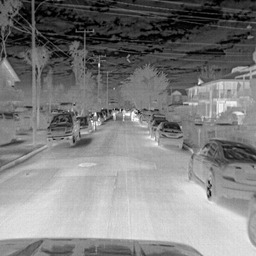

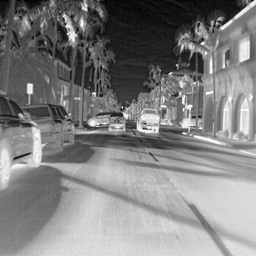

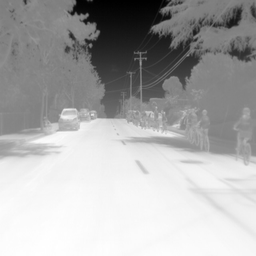

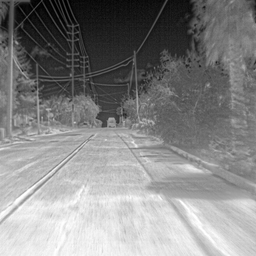

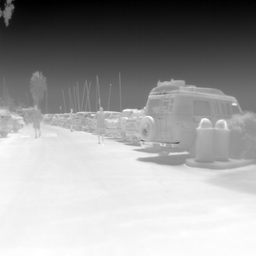

In [11]:
test_path = "/Users/xxx/Documents/Data/FLIR_ADAS_1_3/train/thermal_8_bit" #INPUT FLIR_ADAS Dir use the absolute path
outpath256 =  "/Users/xxx/Documents/vt_cgans/flir_data/train/thermal" #WHERE I WANT THE NEW 256X256 BMPs
#dirs = os.listdir(path)
neww, newh = 256, 256

resize_unet256(test_path, outpath256)

<b>Val -> RGB</b>

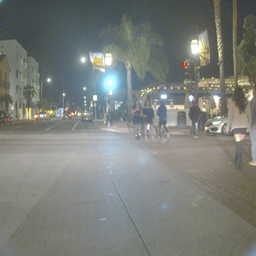

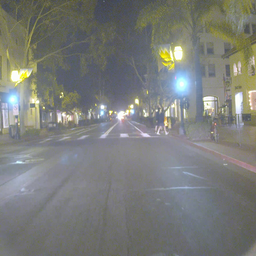

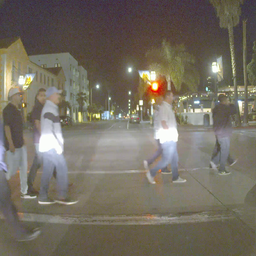

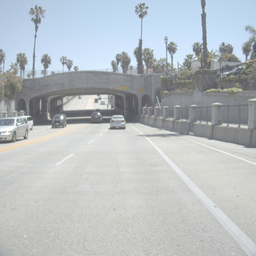

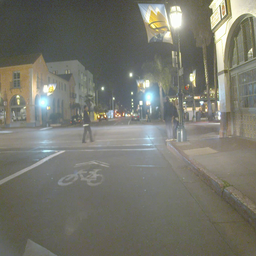

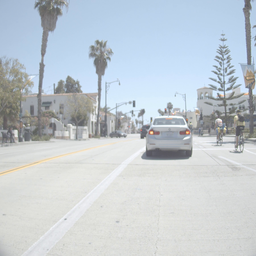

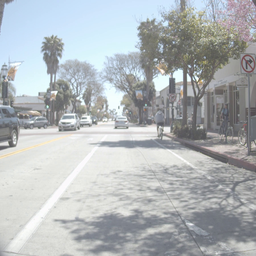

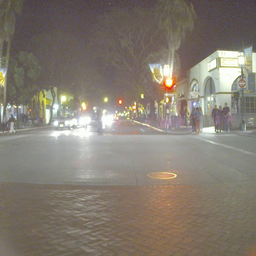

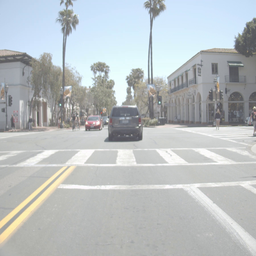

In [12]:
test_path = "/Users/xxx/Documents/Data/FLIR_ADAS_1_3/val/RGB" #INPUT FLIR_ADAS Dir use the absolute path
outpath256 =  "/Users/xxx/Documents/vt_cgans/flir_data/val/rgb" #WHERE I WANT THE NEW 256X256 BMPs
#dirs = os.listdir(path)
neww, newh = 256, 256

resize_unet256(test_path, outpath256)

<b>Val -> thermal</b>

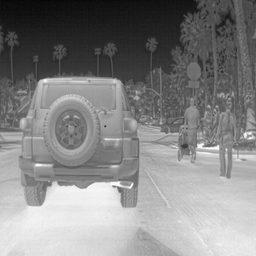

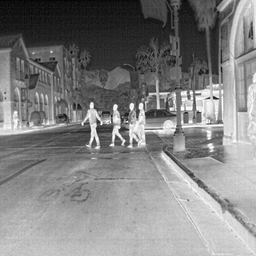

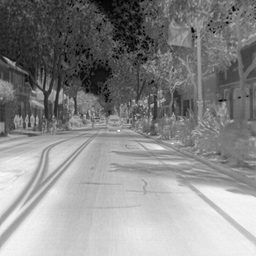

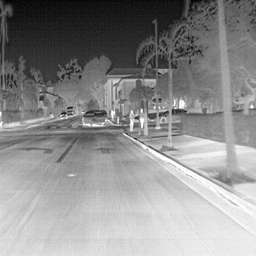

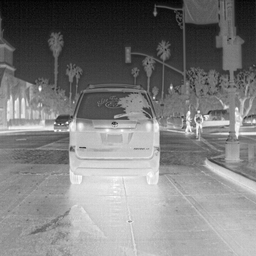

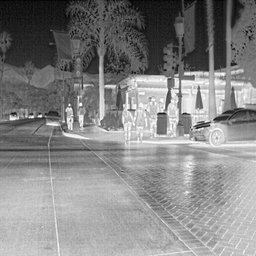

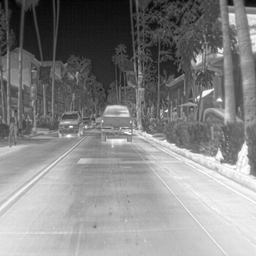

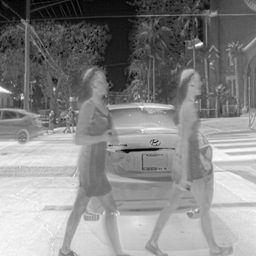

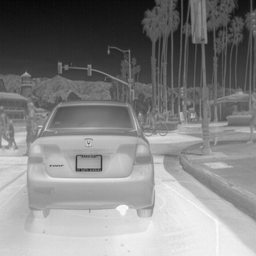

In [13]:
test_path = "/Users/xxx/Documents/Data/FLIR_ADAS_1_3/val/thermal_8_bit" #INPUT FLIR_ADAS Dir use the absolute path
outpath256 =  "/Users/xxx/Documents/vt_cgans/flir_data/val/thermal" #WHERE I WANT THE NEW 256X256 BMPs
#dirs = os.listdir(path)
neww, newh = 256, 256

resize_unet256(test_path, outpath256)

<b>Test -> RGB</b>

Using the video directory

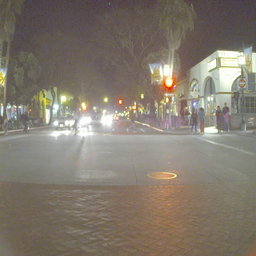

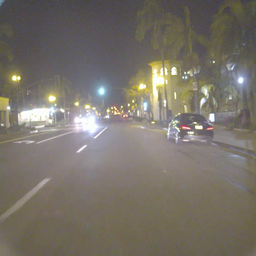

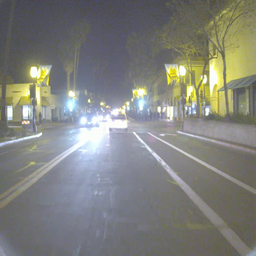

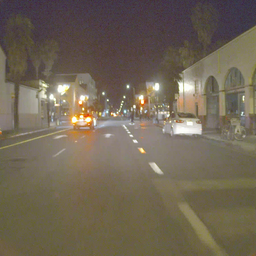

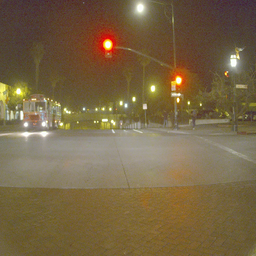

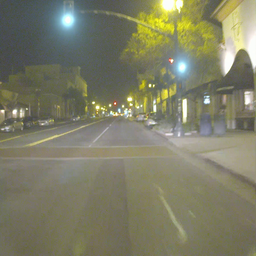

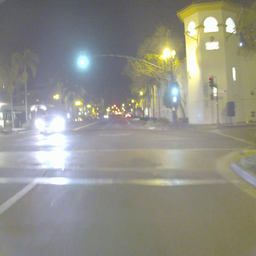

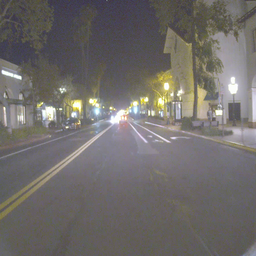

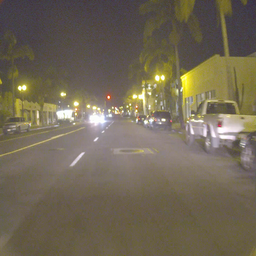

In [32]:
test_path = "/home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/video/RGB" #INPUT FLIR_ADAS Dir use the absolute path
outpath256 =  "/home/xxx/vt_cgans/flir_data/test/rgb" #WHERE I WANT THE NEW 256X256 BMPs
#dirs = os.listdir(path)
neww, newh = 256, 256

resize_unet256(test_path, outpath256)

<b>Test -> Thermal</b>

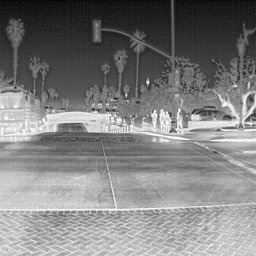

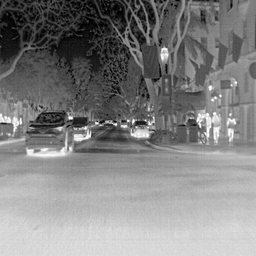

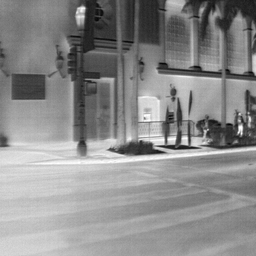

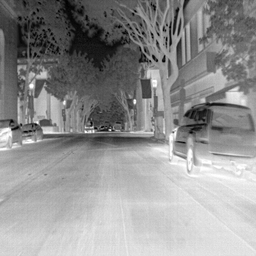

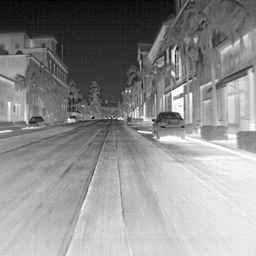

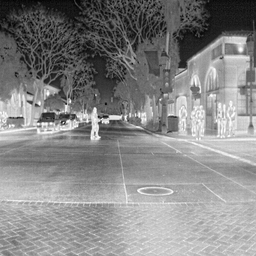

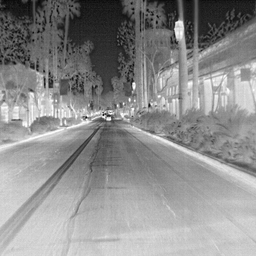

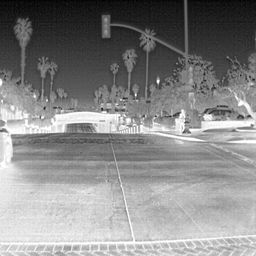

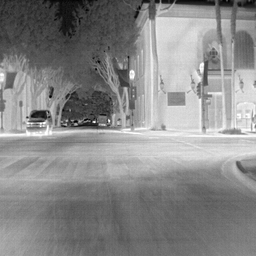

In [33]:
test_path = "/home/xxx/Documents/Data/flir/FLIR_ADAS_1_3/video/thermal_8_bit" #INPUT FLIR_ADAS Dir use the absolute path
outpath256 =  "/home/xxx/vt_cgans/flir_data/test/thermal" #WHERE I WANT THE NEW 256X256 BMPs
#dirs = os.listdir(path)
neww, newh = 256, 256

resize_unet256(test_path, outpath256)